In [53]:
import torch
import torch.utils.data as data_utils
from torch.autograd import Variable
import pandas as pd
from PIL import Image
from constants import *
from cnn import Net
from resnet import resnet18
from resnet_retrained import _classifier
from wikiart import WikiartDataset
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [54]:
def load_model(path):
    checkpoint = torch.load(path)
    net = checkpoint['model']
    state = checkpoint['state_dict']
    return net, state

In [68]:
def predict(arch, trained_models):
    wiki_test = WikiartDataset(config={'wikiart_path': demo_data_csv, 'images_path': demo_data, 'size': 3,
                                       'arch': arch})

    wiki_test_dataloader = data_utils.DataLoader(wiki_test, batch_size=1, shuffle=False, num_workers=2,
                                                 drop_last=False)

    # load a model
    path = pickle_path + trained_models[arch]
    y_pred = []

    if arch == 'cnn':
        cnn_model = load_model(path)
        net = cnn_model[0]
        sz = 32
    elif arch=='resnet18':
        resnet_pre_model = load_model(path)
        net = resnet_pre_model[0]
        sz = 224
    elif arch == 'resnet18_re':
        resnet_tuned_model = load_model(path)
        net = resnet_tuned_model[0]
        sz = 224

    for data in wiki_test_dataloader:
        images, labels = data['image'], data['class']
        
        batchsize = images.shape[0]
        images = images.view(batchsize, 3, sz, sz)
        outputs = net(Variable(images))
        _, predicted = torch.max(outputs.data, 1)
        c = (predicted == labels).squeeze()

        y = predicted[0]
        y_pred.append(y)

    return y_pred

In [73]:
def show_training_data(predictions, train_data, train_images):

    train = pd.read_csv(train_data, sep=',')

    for idx, p in enumerate(predictions):
        temp = train[train['class'] == p].head(5)
        
        paintings = []

        for i in range(temp.shape[0]):
            row = temp.iloc[i]
            img_path = train_images + row['location']
        
            artist = row['artist']
            paintings.append(img_path)
        grid = make_grid(artist, paintings, idx)
        
        grid.show()

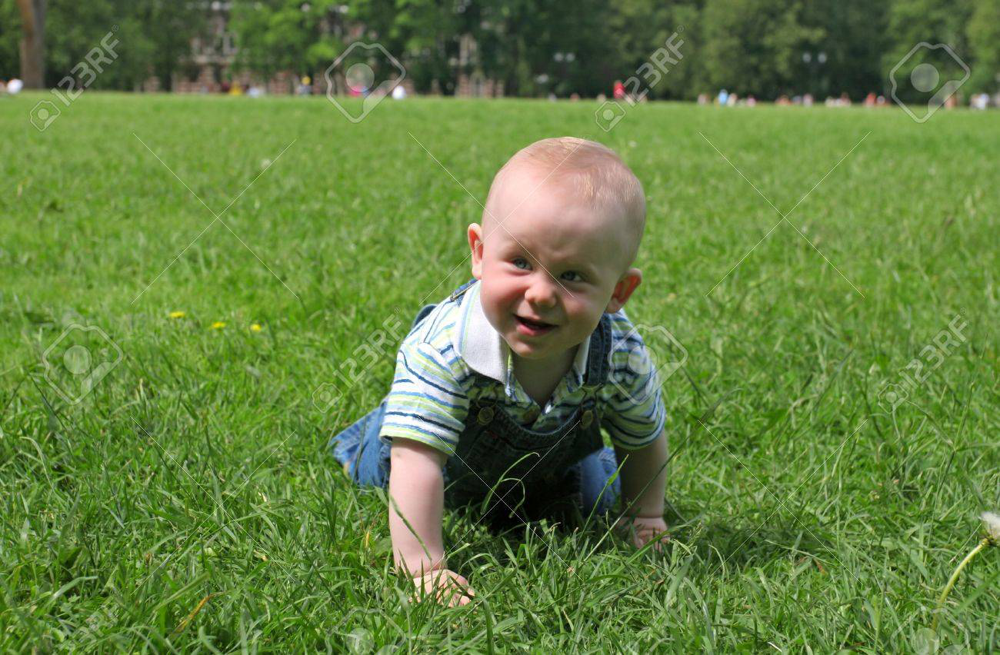

In [72]:
test1 = Image.open(demo_data+'3279596-The-kid-playing-on-a-grass-in-park-Stock-Photo.jpg')
test1

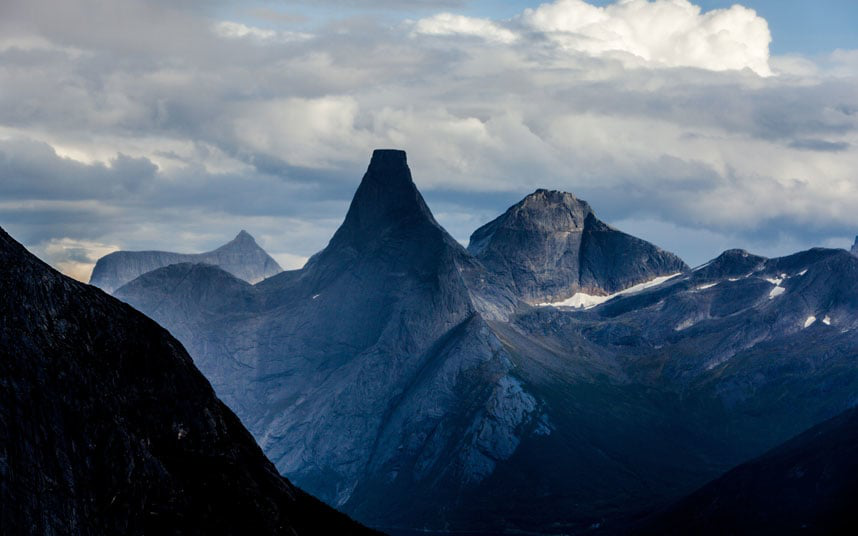

In [47]:
test2 = Image.open(demo_data+'mountains-stetind_3374095a.jpg')
test2

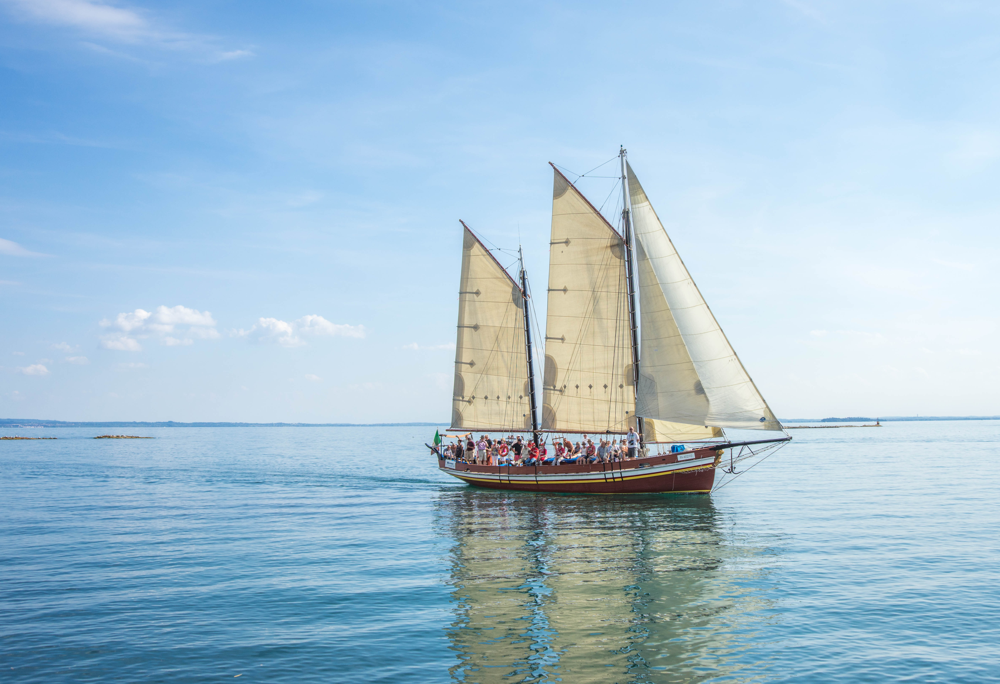

In [48]:
test3 = Image.open(demo_data+'ship-boat-lake-garda-italy.jpg')
test3

In [63]:
from matplotlib.pyplot import imshow
import numpy as np
%matplotlib inline
        
test_images = [test1, test2, test3]

def make_grid(artist, paintings, idx):
    x_offset = 0
    img_grid = Image.new('RGB', (600*5, 600))
    for i, p in enumerate(paintings):
        im = Image.open(p)
        im = im.resize((600, 600))
        img_grid.paste(im, (x_offset, 0))
        x_offset += 600
    img_grid.save(demo_data+artist+'.jpg')
    print("Artist predicted:", artist)
    return img_grid

In [50]:
# CNN - 2 Layer
predictions = predict('cnn', trained_models=trained_models)
show_training_data(predictions, train_data=train_path, train_images=train_demo_data)

Artist predicted: edouard-manet
Artist predicted: arkhip-kuindzhi
Artist predicted: claude-monet


In [75]:
# ResNet 18 - pretrained
predictions = predict('resnet18', trained_models=trained_models)
show_training_data(predictions, train_data=train_path, train_images=train_demo_data)

UnboundLocalError: local variable 'artist' referenced before assignment

In [74]:
# ResNet-18 fine tuned
predictions = predict('resnet18_re', trained_models=trained_models)
show_training_data(predictions, train_data=train_path, train_images=train_demo_data)

Artist predicted: armand-guillaumin
Artist predicted: camille-pissarro
Artist predicted: cornelis-vreedenburgh
